<a href="https://colab.research.google.com/github/farmer-nusantara/farmer-nusantara-machine-learning/blob/master/Paddy_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Libraries**

In [ ]:
# Import dependencies
from google.colab import files ## Upload file(s) from local
import zipfile ## Unzip zip file(s)
import os ## Interact with file system
import shutil ## Copy file(s)

## Plot image(s)
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import numpy as np ## Images array handle
import tensorflow as tf ## Deep learning library
from tensorflow.keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator ## Image preprocess and augmentation

import random ## Get random image(s)
import tempfile ## Generate temporary files and directories

# **Data Preperation**

Source Dataset from Kaggle :

[Paddy Dataset 1](https://www.kaggle.com/competitions/paddy-disease-classification/data)

[Paddy Dataset 2](https://www.kaggle.com/datasets/badhon7432/paddyleafdiseaseuci)

In [ ]:
! pip install kaggle

files.upload()

#create folder named kaggle
! mkdir ~/.kaggle

#copy kaggle.json into kaggle folder
! cp kaggle.json ~/.kaggle/

#chance permissions so that only you can read-write
! chmod 600 ~/.kaggle/kaggle.json 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Saving kaggle.json to kaggle.json


## **Downloading Dataset**

In [ ]:
!kaggle competitions download -c paddy-disease-classification



 99% 1.01G/1.02G [00:29<00:00, 26.5MB/s]
100% 1.02G/1.02G [00:29<00:00, 37.0MB/s]


## **Unzipping Dataset**

In [ ]:
file_zip = 'paddy-disease-classification.zip'
zip_ref = zipfile.ZipFile(file_zip, 'r')
zip_ref.extractall('/content/paddy-disease-classification/')
zip_ref.close()

print(os.listdir('/content/paddy-disease-classification/train_images'))

['dead_heart', 'bacterial_leaf_streak', 'tungro', 'hispa', 'blast', 'bacterial_panicle_blight', 'bacterial_leaf_blight', 'downy_mildew', 'brown_spot', 'normal']


# **Exploratory Data Analysis**

In [ ]:
def move_image(src_dir, classname_list, destination_root_dir):
  """
  Params:
          src_dir: Root directory of source, enclosed by string
          classname_list : List contains desired name of class(es), ordered alphabetically
          destination_root_dir : Root directory of destination
  """ 
  if not os.path.exists(destination_root_dir):
    os.makedirs(destination_root_dir) 
  class_src = sorted([dirs for root, dirs, files in os.walk(src_dir)][0])
  for index in range(len(classname_list)):
    if os.path.exists(os.path.join(destination_root_dir, str(classname_list[index]))):
      os.makedirs(os.path.join(destination_root_dir, str(classname_list[index])))
    if len(class_src) == len(classname_list):
      shutil.copytree(os.path.join(src_dir, str(class_src[index])),
                      os.path.join(destination_root_dir, str(classname_list[index]))) 
    else:
      raise Exception("Number of directories not equal between source and destination")

In [ ]:
paddyleaf_classname = ['Bacterial Leaf Blight',
                      'Bacterial Leaf Streak',
                      'Bacterial Panicle Blight',
                      'Blast',
                      'Brown Spot',
                      'Dead Heart',
                      'Down Mildew',
                      'Hispa',
                      'Normal',
                      'Tungro']

src_dir = ('/content/paddy-disease-classification/train_images')
root_dir = '/tmp/Data'

if os.path.exists(root_dir):
  shutil.rmtree(root_dir)

move_image(src_dir, paddyleaf_classname, root_dir)

In [ ]:
def simple_eda(data_dir):
  """
  Params:
              
  """ 
  class_list = sorted([dirs for root, dirs, files in os.walk(data_dir)][0])
  class_num = len(class_list)
  print("There are {} classes with various number of images for each".format(class_num))

  images_num = []
  for each_class in class_list:
    class_dir = os.path.join(data_dir, each_class)
    images_num.append(len(os.listdir(class_dir)))
    print("\n - {} : {} images".format(each_class, len(os.listdir(class_dir))))

  plt.figure(figsize=(8, 6))
  ax = plt.subplot()
  plt.setp(ax.get_xticklabels(), rotation=30, ha='right')
  plt.bar(class_list, images_num, zorder=3)
  plt.grid(zorder=0)
  plt.title("Images Distribution", fontsize=20)
  plt.xlabel("Classes/Categories", fontsize=12)
  plt.show()

def display_sample(data_dir, num_sample):
  class_list = sorted([dirs for root, dirs, files in os.walk(data_dir)][0])
  for each_class in class_list:
    class_dir = os.path.join(data_dir, each_class)
    plt.figure(figsize=(100/num_sample, 4))
    print("\nLabel: {}".format(each_class))
    for index, image_path in enumerate(os.listdir(class_dir)[:num_sample]):
        ax = plt.subplot(1, num_sample, index+1)
        image = mpimg.imread(os.path.join(class_dir, image_path))
        ax.grid()
        plt.imshow(image)
    plt.show()

There are 10 classes with various number of images for each

 - Bacterial Leaf Blight : 479 images

 - Bacterial Leaf Streak : 380 images

 - Bacterial Panicle Blight : 337 images

 - Blast : 1738 images

 - Brown Spot : 965 images

 - Dead Heart : 1442 images

 - Down Mildew : 620 images

 - Hispa : 1594 images

 - Normal : 1764 images

 - Tungro : 1088 images


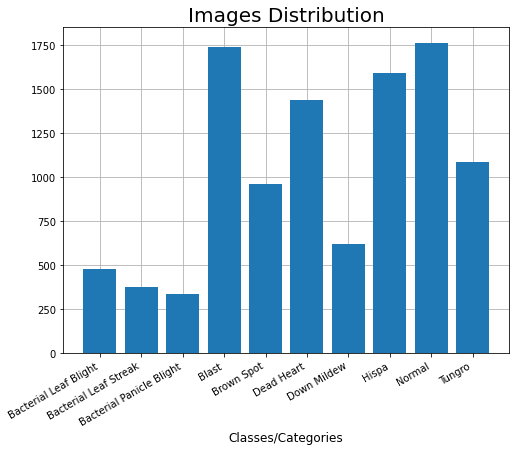

In [ ]:
simple_eda(root_dir)


Label: Bacterial Leaf Blight


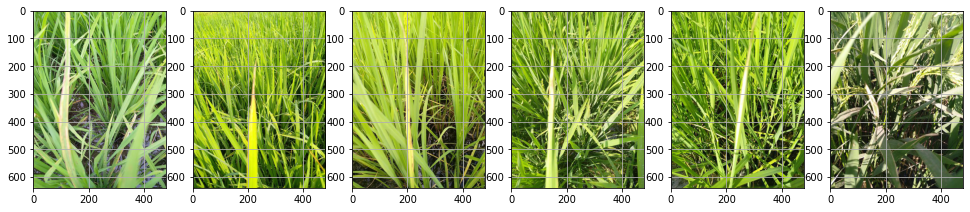


Label: Bacterial Leaf Streak


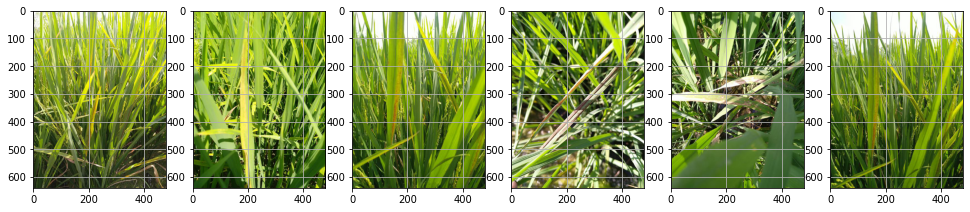


Label: Bacterial Panicle Blight


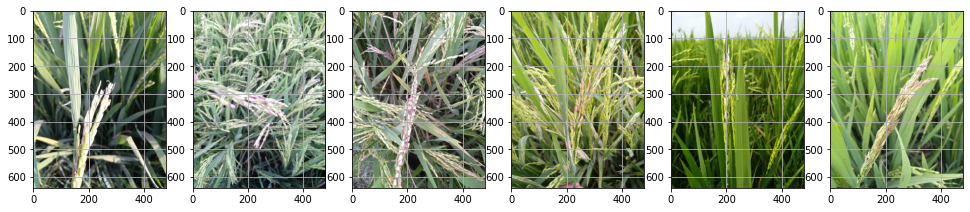


Label: Blast


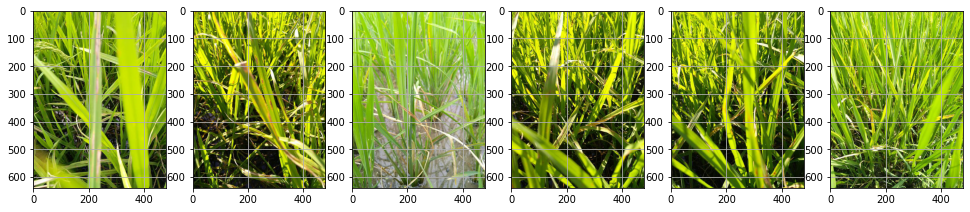


Label: Brown Spot


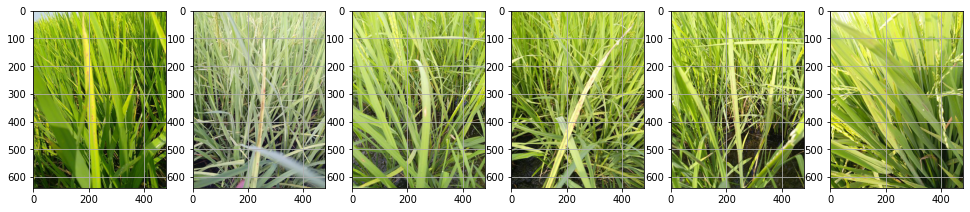


Label: Dead Heart


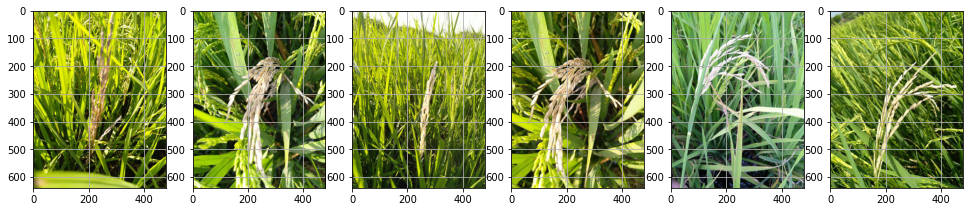


Label: Down Mildew


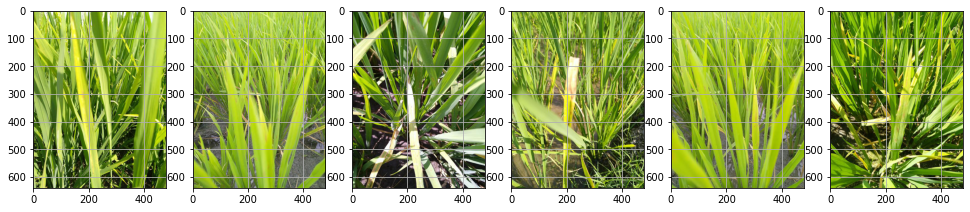


Label: Hispa


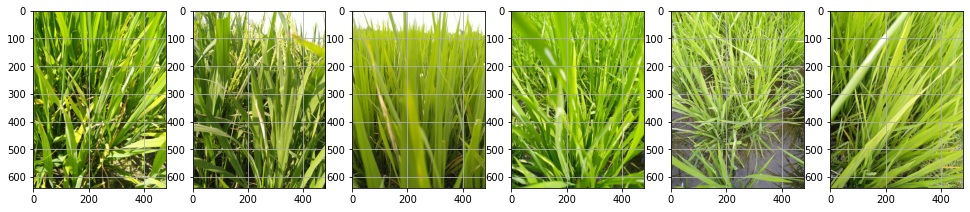


Label: Normal


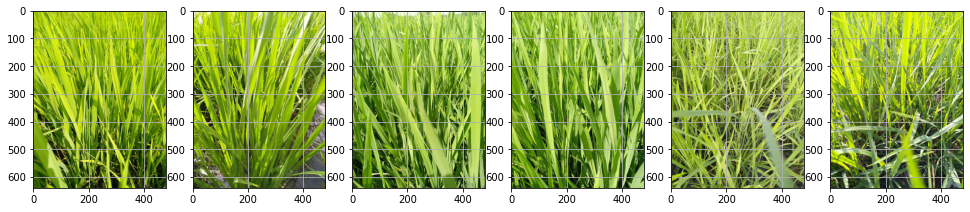


Label: Tungro


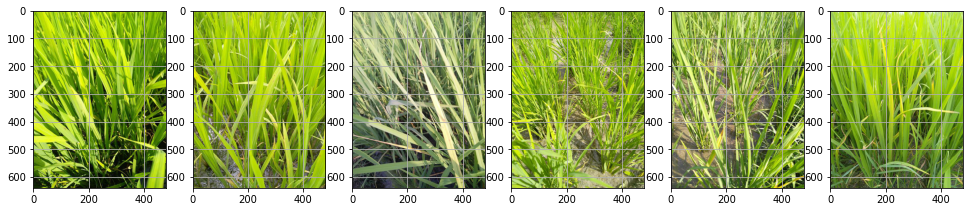

In [ ]:
display_sample(root_dir, num_sample=6)

# **Split Dataset**

In [ ]:
def split_class_data(SOURCE, TRAINING, VALIDATION, TESTING, SPLIT_SIZE):
  """
  Params:
              
  """ 
  for dir in [TRAINING, VALIDATION, TESTING]:
    if not os.path.exists(dir):
      os.makedirs(dir)

  if SPLIT_SIZE > 1 or SPLIT_SIZE < 0:
    raise Exception('split size should be between 0 and 1')

  train_val_len = int(len(os.listdir(SOURCE)) * SPLIT_SIZE)
  for index, file in enumerate(os.listdir(SOURCE)): 
    if index < train_val_len:
      if index < int(.95 * train_val_len):
        shutil.copy(os.path.join(SOURCE, file), os.path.join(str(TRAINING)))
      else:
        shutil.copy(os.path.join(SOURCE, file), os.path.join(str(VALIDATION)))
    else:
      shutil.copy(os.path.join(SOURCE, file), os.path.join(str(TESTING)))

def display_distribution(DIR, split_type=['Train', 'Validation', 'Test']):
  """
  Params:
                  
  """ 
  user_input_type = [split_type]
  type_list = ['Train', 'Validation', 'Test']
  if len(user_input_type) > 1:
    raise Exception("Please choose one type of split")
  if user_input_type[0] not in type_list:
    raise Exception("Please choose a type of split that provided; \'Train\', \'Validation\', or \'Test\'")
  
  print("\n{}".format(user_input_type[0]))
  for dir_class in sorted(os.listdir(DIR)):
    print('{}: {} images'.format(dir_class, len(os.listdir(os.path.join(DIR, dir_class)))))

In [ ]:
root_split_dir = '/tmp/Split'

if os.path.exists(root_split_dir):
  shutil.rmtree(root_split_dir)

train_split_dir = os.path.join(root_split_dir, 'Train')
validation_split_dir = os.path.join(root_split_dir, 'Validation')
test_split_dir = os.path.join(root_split_dir, 'Test')

bacterial_leaf_blight_train_dir = os.path.join(train_split_dir, paddyleaf_classname[0])
bacterial_leaf_streak_train_dir = os.path.join(train_split_dir, paddyleaf_classname[1])
bacterial_panicle_blight_train_dir = os.path.join(train_split_dir, paddyleaf_classname[2])
blast_train_dir = os.path.join(train_split_dir, paddyleaf_classname[3])
brown_spot_train_dir = os.path.join(train_split_dir, paddyleaf_classname[4])
dead_heart_train_dir = os.path.join(train_split_dir, paddyleaf_classname[5])
downy_mildew_train_dir = os.path.join(train_split_dir, paddyleaf_classname[6])
hispa_train_dir = os.path.join(train_split_dir, paddyleaf_classname[7])
normal_train_dir = os.path.join(train_split_dir, paddyleaf_classname[8])
tungro_train_dir = os.path.join(train_split_dir, paddyleaf_classname[9])

bacterial_leaf_blight_validation_dir = os.path.join(validation_split_dir, paddyleaf_classname[0])
bacterial_leaf_streak_validation_dir = os.path.join(validation_split_dir, paddyleaf_classname[1])
bacterial_panicle_blight_validation_dir = os.path.join(validation_split_dir, paddyleaf_classname[2])
blast_validation_dir = os.path.join(validation_split_dir, paddyleaf_classname[3])
brown_spot_validation_dir = os.path.join(validation_split_dir, paddyleaf_classname[4])
dead_heart_validation_dir = os.path.join(validation_split_dir, paddyleaf_classname[5])
downy_mildew_validation_dir = os.path.join(validation_split_dir, paddyleaf_classname[6])
hispa_validation_dir = os.path.join(validation_split_dir, paddyleaf_classname[7])
normal_validation_dir = os.path.join(validation_split_dir, paddyleaf_classname[8])
tungro_validation_dir = os.path.join(validation_split_dir, paddyleaf_classname[9])

bacterial_leaf_blight_test_dir = os.path.join(test_split_dir, paddyleaf_classname[0])
bacterial_leaf_streak_test_dir = os.path.join(test_split_dir, paddyleaf_classname[1])
bacterial_panicle_blight_test_dir = os.path.join(test_split_dir, paddyleaf_classname[2])
blast_test_dir = os.path.join(test_split_dir, paddyleaf_classname[3])
brown_spot_test_dir = os.path.join(test_split_dir, paddyleaf_classname[4])
dead_heart_test_dir = os.path.join(test_split_dir, paddyleaf_classname[5])
downy_mildew_test_dir = os.path.join(test_split_dir, paddyleaf_classname[6])
hispa_test_dir = os.path.join(test_split_dir, paddyleaf_classname[7])
normal_test_dir = os.path.join(test_split_dir, paddyleaf_classname[8])
tungro_test_dir = os.path.join(test_split_dir, paddyleaf_classname[9])

bacterial_leaf_blight_source_dir = os.path.join(root_dir, paddyleaf_classname[0])
bacterial_leaf_streak_source_dir = os.path.join(root_dir, paddyleaf_classname[1])
bacterial_panicle_blight_source_dir = os.path.join(root_dir, paddyleaf_classname[2])
blast_source_dir = os.path.join(root_dir, paddyleaf_classname[3])
brown_spot_source_dir = os.path.join(root_dir, paddyleaf_classname[4])
dead_heart_source_dir = os.path.join(root_dir, paddyleaf_classname[5])
downy_mildew_source_dir = os.path.join(root_dir, paddyleaf_classname[6])
hispa_source_dir = os.path.join(root_dir, paddyleaf_classname[7])
normal_source_dir = os.path.join(root_dir, paddyleaf_classname[8])
tungro_source_dir = os.path.join(root_dir, paddyleaf_classname[9])

split_size = .999

split_class_data(bacterial_leaf_blight_source_dir, bacterial_leaf_blight_train_dir, bacterial_leaf_blight_validation_dir, bacterial_leaf_blight_test_dir, split_size)
split_class_data(bacterial_leaf_streak_source_dir, bacterial_leaf_streak_train_dir, bacterial_leaf_streak_validation_dir, bacterial_leaf_streak_test_dir, split_size)
split_class_data(bacterial_panicle_blight_source_dir, bacterial_panicle_blight_train_dir, bacterial_panicle_blight_validation_dir, bacterial_panicle_blight_test_dir, split_size)
split_class_data(blast_source_dir, blast_train_dir, blast_validation_dir, blast_test_dir, split_size)
split_class_data(brown_spot_source_dir, brown_spot_train_dir, brown_spot_validation_dir, brown_spot_test_dir, split_size)
split_class_data(dead_heart_source_dir, dead_heart_train_dir, dead_heart_validation_dir, dead_heart_test_dir, split_size)
split_class_data(downy_mildew_source_dir, downy_mildew_train_dir, downy_mildew_validation_dir, downy_mildew_test_dir, split_size)
split_class_data(hispa_source_dir, hispa_train_dir, hispa_validation_dir, hispa_test_dir, split_size)
split_class_data(normal_source_dir, normal_train_dir, normal_validation_dir, normal_test_dir, split_size)
split_class_data(tungro_source_dir, tungro_train_dir, tungro_validation_dir, tungro_test_dir, split_size)

print('[Split Distribution]')
display_distribution(train_split_dir, split_type='Train')
display_distribution(validation_split_dir, split_type='Validation')
display_distribution(test_split_dir, split_type='Test')

[Split Distribution]

Train
Bacterial Leaf Blight: 454 images
Bacterial Leaf Streak: 360 images
Bacterial Panicle Blight: 319 images
Blast: 1649 images
Brown Spot: 915 images
Dead Heart: 1368 images
Down Mildew: 588 images
Hispa: 1512 images
Normal: 1673 images
Tungro: 1031 images

Validation
Bacterial Leaf Blight: 24 images
Bacterial Leaf Streak: 19 images
Bacterial Panicle Blight: 17 images
Blast: 87 images
Brown Spot: 49 images
Dead Heart: 72 images
Down Mildew: 31 images
Hispa: 80 images
Normal: 89 images
Tungro: 55 images

Test
Bacterial Leaf Blight: 1 images
Bacterial Leaf Streak: 1 images
Bacterial Panicle Blight: 1 images
Blast: 2 images
Brown Spot: 1 images
Dead Heart: 2 images
Down Mildew: 1 images
Hispa: 2 images
Normal: 2 images
Tungro: 2 images


# **Image Augmentation & Data Generator**

In [ ]:
def train_val_generator(TRAINING_DIR, VALIDATION_DIR, 
                         TARGET_SIZE, TRAIN_BATCH_SIZE, VAL_BATCH_SIZE):
  """
  Params:
        TRAINING_DIR: Directory for training split that contains classes directory
        VALIDATION_DIR: Directory for validation split that contains classes directory
        TARGET_SIZE: Tuple contains target size height and width
        TRAIN_BATCH_SIZE: Desired train split batch size
        VAL_BATCH_SIZE: Desired validation split batch size
  Returns:
        train_genetator: Image data generator for train split
        validation_generator: Image data generator for validation split
  """ 
  ## Instantiate the ImageDataGenerator class with images augmentation
  train_datagen = ImageDataGenerator(rescale=1./255,
                                     rotation_range=40,
                                     width_shift_range=.2,
                                     height_shift_range=.2,
                                     shear_range=.2,
                                     zoom_range=.2,
                                     horizontal_flip=True,
                                     fill_mode='nearest')

  ## Pass in the appropriate arguments to the flow_from_directory method
  train_generator = train_datagen.flow_from_directory(directory=TRAINING_DIR,
                                                      batch_size=TRAIN_BATCH_SIZE,
                                                      class_mode='categorical',
                                                      target_size=TARGET_SIZE)

  # Instantiate the ImageDataGenerator class
  validation_datagen = ImageDataGenerator(rescale=1./255)

  # Pass in the appropriate arguments to the flow_from_directory method
  validation_generator = validation_datagen.flow_from_directory(directory=VALIDATION_DIR,
                                                                batch_size=VAL_BATCH_SIZE,
                                                                class_mode='categorical',
                                                                target_size=TARGET_SIZE)
  return train_generator, validation_generator

In [ ]:
# Set batch size and target image size
train_batch_size = 256
val_batch_size = 128
target_size = (150, 150)

# Get train and validation data generator
train_generator, validation_generator = train_val_generator(train_split_dir,
                                                            validation_split_dir,
                                                            target_size,
                                                            train_batch_size,
                                                            val_batch_size)

Found 9869 images belonging to 10 classes.
Found 523 images belonging to 10 classes.


In [ ]:
print("Train Generator code for each class \n{}".format(train_generator.class_indices))
print("\n Validation Generator code for each class \n{}".format(validation_generator.class_indices))

Train Generator code for each class 
{'Bacterial Leaf Blight': 0, 'Bacterial Leaf Streak': 1, 'Bacterial Panicle Blight': 2, 'Blast': 3, 'Brown Spot': 4, 'Dead Heart': 5, 'Down Mildew': 6, 'Hispa': 7, 'Normal': 8, 'Tungro': 9}

 Validation Generator code for each class 
{'Bacterial Leaf Blight': 0, 'Bacterial Leaf Streak': 1, 'Bacterial Panicle Blight': 2, 'Blast': 3, 'Brown Spot': 4, 'Dead Heart': 5, 'Down Mildew': 6, 'Hispa': 7, 'Normal': 8, 'Tungro': 9}


# **Model v1.1**

## **Model Architecture**

In [ ]:
def create_model(TARGET_SIZE):
  """
  Params:
        TARGET_SIZE: Tuple contains target size height and width   
  Returns:
        model: Created model
  """ 
  model = tf.keras.models.Sequential([ 
      tf.keras.layers.Conv2D(32, (3,3), activation='relu',
                             input_shape=(TARGET_SIZE[0], TARGET_SIZE[1], 3)),
      tf.keras.layers.MaxPooling2D(2,2),
      tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
      tf.keras.layers.MaxPooling2D(2,2),
      tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
      tf.keras.layers.MaxPooling2D(2,2),
      tf.keras.layers.Conv2D(256, (3,3), activation='relu'),
      tf.keras.layers.MaxPooling2D(2,2),
      tf.keras.layers.Flatten(),
      tf.keras.layers.Dense(1024, activation='relu'),
      tf.keras.layers.Dense(512, activation='relu'),
      tf.keras.layers.Dense(10, activation='softmax', name="predict_class")
  ])

  
  model.compile(optimizer=tf.keras.optimizers.Adam(),
                loss='categorical_crossentropy',
                metrics=['accuracy']) 
    
  return model

In [ ]:
modelv1d1 = create_model(target_size)

modelv1d1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 128)      0

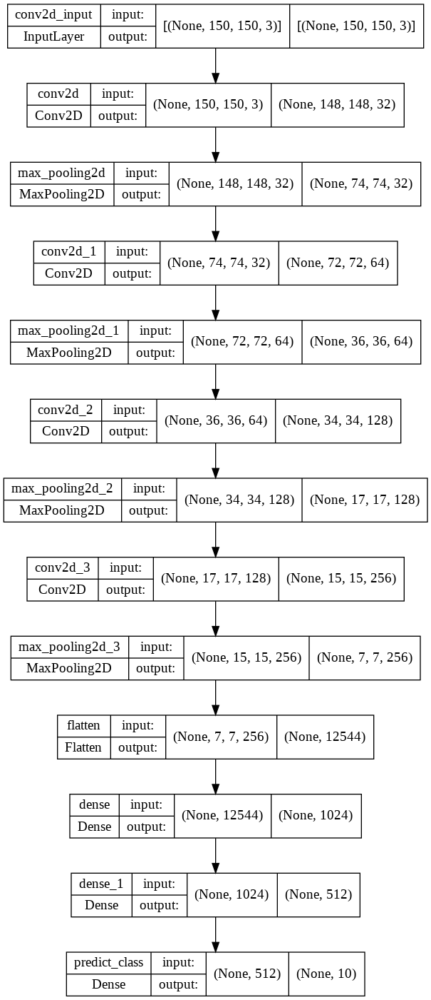

In [ ]:
tf.keras.utils.plot_model(
    modelv1d1,
    to_file='modelv1d1.png',
    show_shapes=True,
    show_layer_names=True,
    rankdir='TB',
    expand_nested=False,
    dpi=96,
)

## **Train the Model**

In [ ]:
# Callbacks schedule
class myCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    # Check
    if logs.get('accuracy') > .99 and logs.get('val_accuracy') > .95:

      # Stop if threshold is met
      print("\nThe thresholds are met so stop training!")
      self.model.stop_training = True

    # Get learning rate callbacks
    #lr_schedule = tf.keras.callbacks.LearningRateScheduler(lambda epoch: 1e-8 * 10**(epoch / 20))

# Instantiate class
callbacks = myCallback()

# Create simple early stopping
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=7)


# Model checkpoint
model_checkp = tf.keras.callbacks.ModelCheckpoint('model_v1d1_checkp.h5', monitor='val_accuracy',
                                                  mode='max', verbose=1, save_best_only=True)

In [ ]:
# Train the model
history = modelv1d1.fit(train_generator,
                         epochs=50,
                         steps_per_epoch=int(train_generator.samples/train_batch_size),
                         verbose=1,
                         validation_data=validation_generator,
                         validation_steps=int(validation_generator.samples/val_batch_size),
                         callbacks=[callbacks, early_stop, model_checkp])

Epoch 1/50
38/38 [==============================] - ETA: 0s - loss: 2.1908 - accuracy: 0.1720 
Epoch 1: val_accuracy improved from -inf to 0.21680, saving model to model_v1d1_checkp.h5
38/38 [==============================] - 514s 13s/step - loss: 2.1908 - accuracy: 0.1720 - val_loss: 2.1591 - val_accuracy: 0.2168
Epoch 2/50
38/38 [==============================] - ETA: 0s - loss: 2.0052 - accuracy: 0.2823 
Epoch 2: val_accuracy improved from 0.21680 to 0.34961, saving model to model_v1d1_checkp.h5
38/38 [==============================] - 511s 13s/step - loss: 2.0052 - accuracy: 0.2823 - val_loss: 1.9088 - val_accuracy: 0.3496
Epoch 3/50
38/38 [==============================] - ETA: 0s - loss: 1.9001 - accuracy: 0.3257 
Epoch 3: val_accuracy did not improve from 0.34961
38/38 [==============================] - 512s 13s/step - loss: 1.9001 - accuracy: 0.3257 - val_loss: 1.8519 - val_accuracy: 0.3359
Epoch 4/50
38/38 [==============================] - ETA: 0s - loss: 1.7627 - accuracy: 0

## **Result Plot**

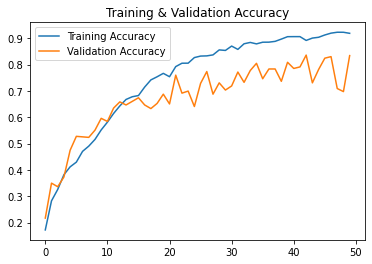

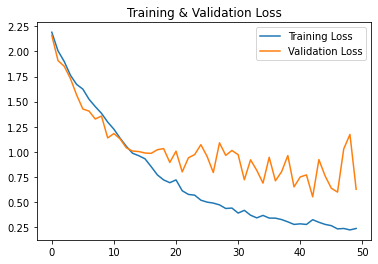

In [ ]:
# Plot the train result
## Get accuracy and val_accuracy histories
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

## Get accuracy and val_accuracy losses
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

## Plot accuracies result
plt.plot(epochs, acc, label = 'Training Accuracy')
plt.plot(epochs, val_acc, label = 'Validation Accuracy')
plt.title('Training & Validation Accuracy')

plt.legend()
plt.show() 

plt.figure()

## Plot losses result
plt.plot(epochs, loss, label ='Training Loss')
plt.plot(epochs, val_loss, label = 'Validation Loss')
plt.title('Training & Validation Loss')

plt.legend()
plt.show()  

## **Image Predict**

Actual class: Bacterial Leaf Streak
Predicted class: Hispa
 with the probabilities for each class as follow 
[2.9283951e-03 4.9530216e-02 1.2017158e-05 9.5943892e-03 3.8838667e-01
 5.9656624e-04 7.1030678e-03 5.0900090e-01 1.8484055e-04 3.2662846e-02]


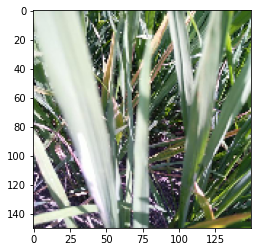

In [ ]:
# Test image preprocess
random_class = os.path.join(test_split_dir, random.choice(paddyleaf_classname))
random_image = random.choice(os.listdir(random_class))
selected_image = load_img(os.path.join(random_class, random_image), target_size=target_size)
x = img_to_array(selected_image)
x = np.expand_dims(x, axis=0)
x = np.vstack([x])
x /= 255.

# Predict the image
classes = modelv1d1.predict(x)
predicted_class = np.argmax(classes[0])

# Display the image and its predicted class
imageplot = plt.imshow(selected_image)
print("Actual class: {}".format(random_class.split('/')[-1]))
print("Predicted class: {}\n with the probabilities for each class as follow \n{}".format(paddyleaf_classname[predicted_class], classes[0]))

Actual class: Dead Heart
Predicted class: Dead Heart
 with the probabilities for each class as follow 
[4.3506560e-14 3.3307745e-13 6.9005896e-06 1.9023387e-08 1.1116906e-14
 9.9999309e-01 6.1252168e-09 5.6554669e-19 7.0705058e-10 2.7546619e-08]


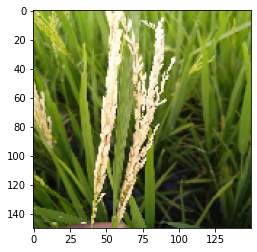

In [ ]:
# Test image preprocess
random_class = os.path.join(test_split_dir, random.choice(paddyleaf_classname))
random_image = random.choice(os.listdir(random_class))
selected_image = load_img(os.path.join(random_class, random_image), target_size=target_size)
x = img_to_array(selected_image)
x = np.expand_dims(x, axis=0)
x = np.vstack([x])
x /= 255.

# Predict the image
classes = modelv1d1.predict(x)
predicted_class = np.argmax(classes[0])

# Display the image and its predicted class
imageplot = plt.imshow(selected_image)
print("Actual class: {}".format(random_class.split('/')[-1]))
print("Predicted class: {}\n with the probabilities for each class as follow \n{}".format(paddyleaf_classname[predicted_class], classes[0]))

## **Save & Export Model**

In [ ]:
# Save the model
## Define temporary directory for save the model
MODEL_DIR = tempfile.gettempdir()
version = 1
diff = 1
version_path = os.path.join(MODEL_DIR, str(version))
export_path = os.path.join(version_path, str(diff))

## Ensure the temporary file
if os.path.isdir(export_path):
    print('\nPrepare the path, cleaning up!\n')
    !rm -r {export_path}

## Save the model
### tf format
modelv1d1.save(export_path, save_format="tf")
print('\nexport_path = {}'.format(export_path))
!ls -l {export_path}

### h5 keras format
saved_h5_format = './paddymodelv1d1.h5' 
modelv1d1.save(saved_h5_format)

INFO:tensorflow:Assets written to: /tmp/1/1/assets

export_path = /tmp/1/1
total 232
drwxr-xr-x 2 root root   4096 Jun  1 11:06 assets
-rw-r--r-- 1 root root  24965 Jun  1 11:06 keras_metadata.pb
-rw-r--r-- 1 root root 199340 Jun  1 11:06 saved_model.pb
drwxr-xr-x 2 root root   4096 Jun  1 11:06 variables


In [ ]:
# Convert to .json format
## Install required library
!pip install tensorflowjs

## Path to .json directory
export_json_path = os.path.join(export_path, 'json_format')

## Ensure the temporary file
if os.path.isdir(export_json_path):
    print('\nPrepare the path, cleaning up!\n')
    !rm -r {export_json_path}

## Convert command
!tensorflowjs_converter --input_format=keras {saved_h5_format} {export_json_path}

##
!zip -r './jsonmodelv1d1.zip' {export_json_path}

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 77 kB 3.5 MB/s 
     |████████████████████████████████| 40 kB 4.6 MB/s 
     |████████████████████████████████| 462 kB 16.2 MB/s 
  Attempting uninstall: packaging
    Found existing installation: packaging 21.3
    Uninstalling packaging-21.3:
      Successfully uninstalled packaging-21.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


  adding: tmp/1/1/json_format/ (stored 0%)
  adding: tmp/1/1/json_format/group1-shard3of14.bin (deflated 8%)
  adding: tmp/1/1/json_format/group1-shard12of14.bin (deflated 7%)
  adding: tmp/1/1/json_format/group1-shard11of14.bin (deflated 7%)
  adding: tmp/1/1/json_format/group1-shard8of14.bin (deflated 7%)
  adding: tmp/1/1/json_format/group1-shard2of14.bin (deflated 7%)
  adding: tmp/1/1/json_format/group1-shard10of14.bin (deflated 7%)
  adding: tmp/1/1/json_format/group1-shard13of14.bin (deflated 7%)
  adding: tmp/1/1/json_format/group1-shard1of14.bin (deflated 7%)
  adding: tmp/1/1/json_format/group1-shard4of14.bin (deflated 8%)
  adding: tmp/1/1/json_format/group1-shard6of14.bin (deflated 8%)
  adding: tmp/1/1/json_format/group1-shard7of14.bin (deflated 8%)
  adding: tmp/1/1/json_format/model.json (deflated 85%)
  adding: tmp/1/1/json_format/group1-shard5of14.bin (deflated 8%)
  adding: tmp/1/1/json_format/group1-shard9of14.bin (deflated 7%)
  adding: tmp/1/1/json_format/group1-sh

In [ ]:
# Convert to .tflite format
## Intialize the TFLite converter to load the SavedModel
converter = tf.lite.TFLiteConverter.from_saved_model(export_path)

## Set the optimization strategy for 'size' in the converter 
converter.optimizations = [tf.lite.Optimize.OPTIMIZE_FOR_SIZE]

## Use the tool to finally convert the model
tflite_model = converter.convert()

## Write TFLite model and its classes
tflite_model_file = 'paddymodel_v1_d1.tflite'

with open(tflite_model_file, "wb") as tf:
    tf.write(tflite_model)

with open('paddyclasses_v1_d1.txt', 'w') as classes:
    classes.write('\n'.join(paddyleaf_classname))

In [ ]:
try:
    files.download('paddymodel_v1_d1.tflite')
    files.download('paddyclasses_v1_d1.txt')
    files.download('jsonmodelv1d1.zip')
    
except:
    pass

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **Model v1.2 - Transfer Learning: InceptionV3**

## **Model Architecture**

In [ ]:
 #Define a Train and Validation set function
def train_val_generator(TRAINING_DIR, VALIDATION_DIR, 
                         TARGET_SIZE, TRAIN_BATCH_SIZE, VAL_BATCH_SIZE):
  """
  Params:
        TRAINING_DIR: Directory for training split that contains classes directory
        VALIDATION_DIR: Directory for validation split that contains classes directory
        TARGET_SIZE: Tuple contains target size height and width
        TRAIN_BATCH_SIZE: Desired train split batch size
        VAL_BATCH_SIZE: Desired validation split batch size
  Returns:
        train_genetator: Image data generator for train split
        validation_generator: Image data generator for validation split
  """ 
  ## Instantiate the ImageDataGenerator class with images augmentation
  train_datagen = ImageDataGenerator(preprocessing_function=tf.keras.applications.inception_v3.preprocess_input, 
                                     rescale=1./255,
                                     rotation_range=40,
                                     width_shift_range=.2,
                                     height_shift_range=.2,
                                     shear_range=.2,
                                     zoom_range=.2,
                                     horizontal_flip=True,
                                     fill_mode='nearest')

  ## Pass in the appropriate arguments to the flow_from_directory method
  train_generator = train_datagen.flow_from_directory(directory=TRAINING_DIR,
                                                      batch_size=TRAIN_BATCH_SIZE,
                                                      class_mode='categorical',
                                                      target_size=TARGET_SIZE)

  # Instantiate the ImageDataGenerator class
  validation_datagen = ImageDataGenerator(rescale=1./255)

  # Pass in the appropriate arguments to the flow_from_directory method
  validation_generator = validation_datagen.flow_from_directory(directory=VALIDATION_DIR,
                                                                batch_size=VAL_BATCH_SIZE,
                                                                class_mode='categorical',
                                                                target_size=TARGET_SIZE)
  return train_generator, validation_generator

# Set batch size and target image size
train_batch_size = 32
val_batch_size = 32
target_size = (224, 224)

# Get train and validation data generator
train_generator, validation_generator = train_val_generator(train_split_dir,
                                                            validation_split_dir,
                                                            target_size,
                                                            train_batch_size,
                                                            val_batch_size)

Found 9869 images belonging to 10 classes.
Found 523 images belonging to 10 classes.


In [ ]:
# Get the pre-trained model
def create_pre_trained_model(WEIGHTS, TARGET_SIZE):
  """
  Params:
        WEIGHTS: Choosen weights from pre trained model
        TARGET_SIZE: Tuple contains target size height and width   
  Returns:
        pre_trained_model: Imported pre trained model
  """ 
  ## Import InceptionV3 Model
  pre_trained_model = tf.keras.applications.inception_v3.InceptionV3(
      input_shape = (TARGET_SIZE[0], TARGET_SIZE[1], 3),
      include_top = False, 
      weights = WEIGHTS) 

  ## Make all the layers in the pre-trained model non-trainable
  for layer in pre_trained_model.layers:
    layer.trainable = False

  return pre_trained_model

In [ ]:
# Execute create_pre_trained_model function
## Use ImageNet as weights
pre_trained_model = create_pre_trained_model("imagenet", target_size)

## Print the model summary
pre_trained_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_192 (Conv2D)            (None, 111, 111, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_188 (Batch  (None, 111, 111, 32  96         ['conv2d_192[0][0]']             
 Normalization)                 )                                                      

In [ ]:
# Create a function to pipeline imported model
## Set the desired layer from pre-trained model as a input for self-model
def output_of_last_layer(PRE_TRAINED_MODEL):
  """
  Params:
        PRE_TRAINED_MODEL: Imported pre trained model  
  Returns:
        last_output: The desired layer as a input for self-model
  """ 
  last_desired_layer = PRE_TRAINED_MODEL.get_layer('mixed7')
  last_output = last_desired_layer.output

  return last_output

In [ ]:
# Execute the prior function
last_output = output_of_last_layer(pre_trained_model)

In [ ]:
# Create Final Model
def create_model(PRE_TRAINED_MODEL, LAST_OUTPUT):
  """
  Params:
        PRE_TRAINED_MODEL: Imported pre trained model 
        LAST_OUTPUT: The desired layer as a input for self-model  
  Returns:
        model: Created model
  """ 
  # Flatten the output layer to 1 dimension
  x = tf.keras.layers.Flatten()(LAST_OUTPUT)
  # Add a fully connected layer with hidden units and ReLU activation
  x = tf.keras.layers.Dense(1024, activation='relu')(x)
  # Add a dropout rate
  x = tf.keras.layers.Dropout(.5)(x)
  # Add another hidden layer
  x = tf.keras.layers.Dense(512, activation='relu')(x)
  # Add a output layer for classification
  x = tf.keras.layers.Dense(10, activation='softmax', name="predict_class")(x) 

  # Create the complete model by using the Model class
  model = tf.keras.Model(inputs=PRE_TRAINED_MODEL.input, outputs=x)

  # Compile the model
  model.compile(optimizer = tf.keras.optimizers.Adam(), 
                loss = 'categorical_crossentropy',
                metrics = ['accuracy'])

  return model

In [ ]:
# Get the model architecture by pass target_size defined before
modelv1d2 = create_model(pre_trained_model, last_output)

# Get model summary
modelv1d2.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_192 (Conv2D)            (None, 111, 111, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_188 (Batch  (None, 111, 111, 32  96         ['conv2d_192[0][0]']             
 Normalization)                 )                                                           

In [ ]:
# plot the model architecture
tf.keras.utils.plot_model(
    modelv1d2,
    to_file='modelv1d2.png',
    show_shapes=True,
    show_layer_names=True,
    rankdir='TB',
    expand_nested=False,
    dpi=96,
)

## **Train the Model**

In [ ]:
# Callbacks schedule
class myCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    # Check
    if logs.get('accuracy') > .99 and logs.get('val_accuracy') > .95:

      # Stop if threshold is met
      print("\nThe thresholds are met so stop training!")
      self.model.stop_training = True

    # Get learning rate callbacks
    #lr_schedule = tf.keras.callbacks.LearningRateScheduler(lambda epoch: 1e-8 * 10**(epoch / 20))

# Instantiate class
callbacks = myCallback()

# Create simple early stopping
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=7)


# Model checkpoint
model_checkp = tf.keras.callbacks.ModelCheckpoint('model_v1d2_checkp.h5', monitor='val_accuracy',
                                                  mode='max', verbose=1, save_best_only=True)

In [ ]:
# Train the model
history = modelv1d2.fit(train_generator,
                         epochs=50,
                         steps_per_epoch=int(train_generator.samples/train_batch_size),
                         verbose=1,
                         validation_data=validation_generator,
                         validation_steps=int(validation_generator.samples/val_batch_size),
                         callbacks=[callbacks, early_stop, model_checkp])

Epoch 1/50
308/308 [==============================] - ETA: 0s - loss: 3.0286 - accuracy: 0.1636
Epoch 1: val_accuracy improved from -inf to 0.17773, saving model to model_v1d2_checkp.h5
308/308 [==============================] - 1096s 4s/step - loss: 3.0286 - accuracy: 0.1636 - val_loss: 2.1798 - val_accuracy: 0.1777
Epoch 2/50
308/308 [==============================] - ETA: 0s - loss: 2.1643 - accuracy: 0.1656
Epoch 2: val_accuracy improved from 0.17773 to 0.18164, saving model to model_v1d2_checkp.h5
308/308 [==============================] - 1092s 4s/step - loss: 2.1643 - accuracy: 0.1656 - val_loss: 2.1548 - val_accuracy: 0.1816
Epoch 3/50
308/308 [==============================] - ETA: 0s - loss: 2.1672 - accuracy: 0.1656
Epoch 3: val_accuracy did not improve from 0.18164
308/308 [==============================] - 1086s 4s/step - loss: 2.1672 - accuracy: 0.1656 - val_loss: 2.1671 - val_accuracy: 0.1797
Epoch 4/50
308/308 [==============================] - ETA: 0s - loss: 2.1620 - 

## **Result Plot**

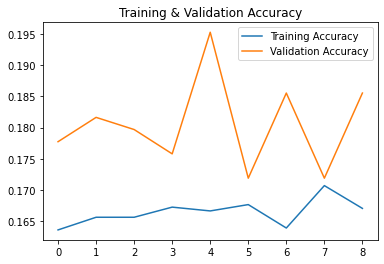

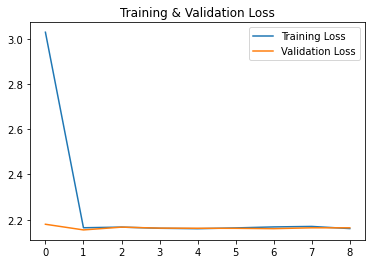

In [ ]:
# Plot the train result
## Get accuracy and val_accuracy histories
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

## Get accuracy and val_accuracy losses
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

## Plot accuracies result
plt.plot(epochs, acc, label = 'Training Accuracy')
plt.plot(epochs, val_acc, label = 'Validation Accuracy')
plt.title('Training & Validation Accuracy')

plt.legend()
plt.show() 

plt.figure()

## Plot losses result
plt.plot(epochs, loss, label ='Training Loss')
plt.plot(epochs, val_loss, label = 'Validation Loss')
plt.title('Training & Validation Loss')

plt.legend()
plt.show()  

## **Image Predict**

Actual class: Dead Heart
Predicted class: Normal
 with the probabilities for each class as follow 
[0.05047814 0.03918893 0.03918749 0.16945894 0.08571175 0.15036015
 0.05038969 0.14187902 0.17058899 0.10275696]


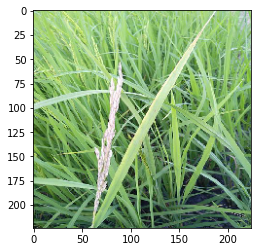

In [ ]:
# Test image preprocess
random_class = os.path.join(test_split_dir, random.choice(paddyleaf_classname))
random_image = random.choice(os.listdir(random_class))
selected_image = load_img(os.path.join(random_class, random_image), target_size=target_size)
x = img_to_array(selected_image)
x = np.expand_dims(x, axis=0)
x = np.vstack([x])
x /= 255.

# Predict the image
classes = modelv1d2.predict(x)
predicted_class = np.argmax(classes[0])

# Display the image and its predicted class
imageplot = plt.imshow(selected_image)
print("Actual class: {}".format(random_class.split('/')[-1]))
print("Predicted class: {}\n with the probabilities for each class as follow \n{}".format(paddyleaf_classname[predicted_class], classes[0]))

Actual class: Blast
Predicted class: Blast
 with the probabilities for each class as follow 
[0.0551714  0.05123578 0.04369359 0.1668496  0.07637031 0.14535655
 0.05547524 0.13652268 0.16541506 0.10390975]


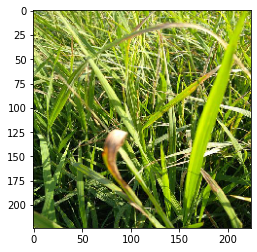

In [ ]:
# Test image preprocess
random_class = os.path.join(test_split_dir, random.choice(paddyleaf_classname))
random_image = random.choice(os.listdir(random_class))
selected_image = load_img(os.path.join(random_class, random_image), target_size=target_size)
x = img_to_array(selected_image)
x = np.expand_dims(x, axis=0)
x = np.vstack([x])
x /= 255.

# Predict the image
classes = modelv1d2.predict(x)
predicted_class = np.argmax(classes[0])

# Display the image and its predicted class
imageplot = plt.imshow(selected_image)
print("Actual class: {}".format(random_class.split('/')[-1]))
print("Predicted class: {}\n with the probabilities for each class as follow \n{}".format(paddyleaf_classname[predicted_class], classes[0]))

## **Save & Export Model**

In [ ]:
# Save the model
## Define temporary directory for save the model
MODEL_DIR = tempfile.gettempdir()
version = 1
diff = 2
version_path = os.path.join(MODEL_DIR, str(version))
export_path = os.path.join(version_path, str(diff))

## Ensure the temporary file
if os.path.isdir(export_path):
    print('\nPrepare the path, cleaning up!\n')
    !rm -r {export_path}

## Save the model
modelv1d2.save(export_path, save_format="tf")
print('\nexport_path = {}'.format(export_path))
!ls -l {export_path}


Prepare the path, cleaning up!

INFO:tensorflow:Assets written to: /tmp/1/2/assets


INFO:tensorflow:Assets written to: /tmp/1/2/assets



export_path = /tmp/1/2
total 3772
drwxr-xr-x 2 root root    4096 May 31 12:34 assets
-rw-r--r-- 1 root root  485929 May 31 12:34 keras_metadata.pb
-rw-r--r-- 1 root root 3366747 May 31 12:34 saved_model.pb
drwxr-xr-x 2 root root    4096 May 31 12:34 variables


In [ ]:
# Intialize the TFLite converter to load the SavedModel
converter = tf.lite.TFLiteConverter.from_saved_model(export_path)

# Set the optimization strategy for 'size' in the converter 
converter.optimizations = [tf.lite.Optimize.OPTIMIZE_FOR_SIZE]

# Use the tool to finally convert the model
tflite_model = converter.convert()

# Write TFLite model and its classes
tflite_model_file = 'paddymodel_v1_d2.tflite'

with open(tflite_model_file, "wb") as tf:
    tf.write(tflite_model)

with open('paddyclasses_v1_d2.txt', 'w') as classes:
    classes.write('\n'.join(paddyleaf_classname))

In [ ]:
try:
    files.download('cassavamodel_v1_d2.tflite')
    files.download('cassavaclasses_v1_d2.txt')
except:
    pass

# **Model v1.3 - Transfer Learning: InceptionV3**

## **Model Architecture**

In [ ]:
# Download the inception v3 weights
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5 \
    -O /tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5

--2022-06-01 12:32:05--  https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5
Resolving storage.googleapis.com (storage.googleapis.com)... 142.251.10.128, 142.251.12.128, 172.217.194.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.251.10.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 87910968 (84M) [application/x-hdf]
Saving to: ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’

/tmp/inception_v3_w 100%[===================>]  83.84M   239MB/s    in 0.4s    

2022-06-01 12:32:06 (239 MB/s) - ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’ saved [87910968/87910968]



In [ ]:
# Get the pre-trained model
def create_pre_trained_model(WEIGHTS, TARGET_SIZE):
  """
  Params:
        WEIGHTS: Choosen weights from pre trained model
        TARGET_SIZE: Tuple contains target size height and width   
  Returns:
        pre_trained_model: Imported pre trained model
  """ 
  ## Import InceptionV3 Model
  pre_trained_model = tf.keras.applications.inception_v3.InceptionV3(
      input_shape = (TARGET_SIZE[0], TARGET_SIZE[1], 3),
      include_top = False, 
      weights = None)

  pre_trained_model.load_weights(WEIGHTS)
  
  return pre_trained_model

In [ ]:
# Execute create_pre_trained_model function
## Use downloaded weights
pre_trained_model = create_pre_trained_model('/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5', 
                                             target_size)

## Print the model summary
pre_trained_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 74, 74, 32)   864         ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 74, 74, 32)  96          ['conv2d[0][0]']                 
 alization)                                                                                       
                                                                                       

In [ ]:
# Create a function to pipeline imported model
## Set the desired layer from pre-trained model as a input for self-model
def output_of_last_layer(PRE_TRAINED_MODEL):
  """
  Params:
        PRE_TRAINED_MODEL: Imported pre trained model  
  Returns:
        last_output: The desired layer as a input for self-model
  """ 
  last_desired_layer = PRE_TRAINED_MODEL.get_layer('mixed7')
  last_output = last_desired_layer.output

  return last_output

In [ ]:
# Execute the prior function
last_output = output_of_last_layer(pre_trained_model)

In [ ]:
# Create Final Model
def create_model(PRE_TRAINED_MODEL, LAST_OUTPUT):
  """
  Params:
        PRE_TRAINED_MODEL: Imported pre trained model 
        LAST_OUTPUT: The desired layer as a input for self-model  
  Returns:
        model: Created model
  """ 
  # Flatten the output layer to 1 dimension
  x = tf.keras.layers.Flatten()(LAST_OUTPUT)
  # Add a fully connected layer with hidden units and ReLU activation
  x = tf.keras.layers.Dense(2048, activation='relu')(x)
  # Add a dropout rate
  x = tf.keras.layers.Dropout(.3)(x)
  # Add another hidden layer
  x = tf.keras.layers.Dense(1024, activation='relu')(x)
  # Add another dropout rate
  #x = tf.keras.layers.Dropout(.3)(x)
  # Add another hidden layer
  #x = tf.keras.layers.Dense(256, activation='relu')(x)
  # Add a output layer for classification
  x = tf.keras.layers.Dense(10, activation='softmax', name="predict_class")(x) 

  # Create the complete model by using the Model class
  model = tf.keras.Model(inputs=PRE_TRAINED_MODEL.input, outputs=x)

  # Fine Tuning
  NUM_LAYERS = 20 #@param {type:"slider", min:1, max:50, step:1}
  do_fine_tuning = True #@param {type:"boolean"}

  if do_fine_tuning:
      optimizer = tf.keras.optimizers.SGD(lr=5e-3, momentum=0.9)
    
      for layer in model.layers[-NUM_LAYERS:]:
          layer.trainable = True

      # Make all the layers in the pre-trained model trainable
      for layer in pre_trained_model.layers:
          layer.trainable = True
  else:
      optimizer = 'adam'

      # Make all the layers in the pre-trained model non-trainable
      for layer in pre_trained_model.layers:
          layer.trainable = False

  model.compile(loss='categorical_crossentropy',
                optimizer=optimizer,
                metrics=['accuracy'])

  return model

In [ ]:
# Get the model architecture by pass target_size defined before
modelv1d3 = create_model(pre_trained_model, last_output)

# Get model summary
modelv1d3.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 74, 74, 32)   864         ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 74, 74, 32)  96          ['conv2d[0][0]']                 
 alization)                                                                                       
                                                                                            

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/gradient_descent.py:102: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(SGD, self).__init__(name, **kwargs)


                                                                                                  
 conv2d_3 (Conv2D)              (None, 35, 35, 80)   5120        ['max_pooling2d[0][0]']          
                                                                                                  
 batch_normalization_3 (BatchNo  (None, 35, 35, 80)  240         ['conv2d_3[0][0]']               
 rmalization)                                                                                     
                                                                                                  
 activation_3 (Activation)      (None, 35, 35, 80)   0           ['batch_normalization_3[0][0]']  
                                                                                                  
 conv2d_4 (Conv2D)              (None, 33, 33, 192)  138240      ['activation_3[0][0]']           
                                                                                                  
 batch_nor

In [ ]:
# plot the model architecture
tf.keras.utils.plot_model(
    modelv1d3,
    to_file='modelv1d3.png',
    show_shapes=True,
    show_layer_names=True,
    rankdir='TB',
    expand_nested=False,
    dpi=96,
)

## **Train the Model**

In [ ]:
# Callbacks schedule
class myCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    # Check
    if logs.get('accuracy') > .99 and logs.get('val_accuracy') > .95:

      # Stop if threshold is met
      print("\nThe thresholds are met so stop training!")
      self.model.stop_training = True

    # Get learning rate callbacks
    #lr_schedule = tf.keras.callbacks.LearningRateScheduler(lambda epoch: 1e-8 * 10**(epoch / 20))

# Instantiate class
callbacks = myCallback()

# Create simple early stopping
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=7)


# Model checkpoint
model_checkp = tf.keras.callbacks.ModelCheckpoint('model_v1d3_checkp.h5', monitor='val_accuracy',
                                                  mode='max', verbose=1, save_best_only=True)

In [ ]:
# Train the model
history = modelv1d3.fit(train_generator,
                         epochs=50,
                         steps_per_epoch=int(train_generator.samples/train_batch_size),
                         verbose=1,
                         validation_data=validation_generator,
                         validation_steps=int(validation_generator.samples/val_batch_size),
                         callbacks=[callbacks, early_stop, model_checkp])

Epoch 1/50
38/38 [==============================] - ETA: 0s - loss: 2.0817 - accuracy: 0.2553
Epoch 1: val_accuracy improved from -inf to 0.38086, saving model to model_v1d3_checkp.h5
38/38 [==============================] - 115s 3s/step - loss: 2.0817 - accuracy: 0.2553 - val_loss: 1.8777 - val_accuracy: 0.3809
Epoch 2/50
38/38 [==============================] - ETA: 0s - loss: 1.6536 - accuracy: 0.4453
Epoch 2: val_accuracy improved from 0.38086 to 0.40430, saving model to model_v1d3_checkp.h5
38/38 [==============================] - 110s 3s/step - loss: 1.6536 - accuracy: 0.4453 - val_loss: 1.7805 - val_accuracy: 0.4043
Epoch 3/50
38/38 [==============================] - ETA: 0s - loss: 1.1919 - accuracy: 0.5978
Epoch 3: val_accuracy improved from 0.40430 to 0.63867, saving model to model_v1d3_checkp.h5
38/38 [==============================] - 102s 3s/step - loss: 1.1919 - accuracy: 0.5978 - val_loss: 1.1514 - val_accuracy: 0.6387
Epoch 4/50
38/38 [==============================] - 

## **Result Plot**

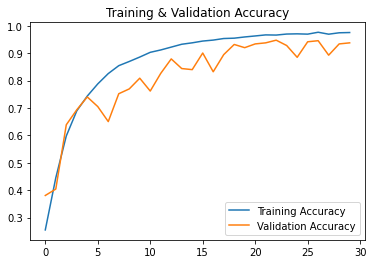

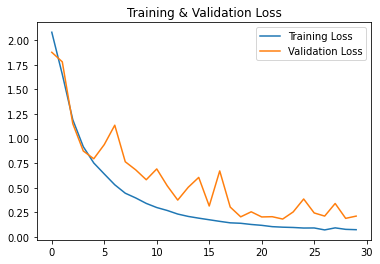

In [ ]:
# Plot the train result
## Get accuracy and val_accuracy histories
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

## Get accuracy and val_accuracy losses
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

## Plot accuracies result
plt.plot(epochs, acc, label = 'Training Accuracy')
plt.plot(epochs, val_acc, label = 'Validation Accuracy')
plt.title('Training & Validation Accuracy')

plt.legend()
plt.show() 

plt.figure()

## Plot losses result
plt.plot(epochs, loss, label ='Training Loss')
plt.plot(epochs, val_loss, label = 'Validation Loss')
plt.title('Training & Validation Loss')

plt.legend()
plt.show()  

## **Overall Accuracy Model**

In [ ]:
train_score = modelv1d3.evaluate(train_generator)
validation_score = modelv1d3.evaluate(validation_generator)

print('Overall Train Accuracy : ', train_score[1])
print('Overall Validation Accuracy: ', validation_score[1])

5/5 [==============================] - 3s 597ms/step - loss: 0.2129 - accuracy: 0.9369
Overall Train Accuracy :  0.9685885310173035
Overall Validation Accuracy:  0.9369024634361267


## **Image Predict**

Actual class: Bacterial Panicle Blight
Predicted class: Bacterial Panicle Blight
 with the probabilities for each class as follow 
[9.0835286e-08 5.0809399e-07 9.9918789e-01 5.8429332e-06 1.3770057e-07
 4.3454114e-05 1.6250063e-08 1.6547880e-09 7.6205999e-04 2.2154439e-10]


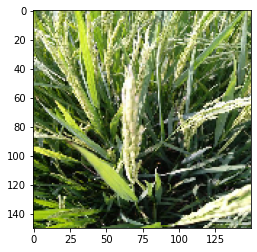

In [ ]:
# Test image preprocess
random_class = os.path.join(test_split_dir, random.choice(paddyleaf_classname))
random_image = random.choice(os.listdir(random_class))
selected_image = load_img(os.path.join(random_class, random_image), target_size=target_size)
x = img_to_array(selected_image)
x = np.expand_dims(x, axis=0)
x = np.vstack([x])
x /= 255.

# Predict the image
classes = modelv1d3.predict(x)
predicted_class = np.argmax(classes[0])

# Display the image and its predicted class
imageplot = plt.imshow(selected_image)
print("Actual class: {}".format(random_class.split('/')[-1]))
print("Predicted class: {}\n with the probabilities for each class as follow \n{}".format(paddyleaf_classname[predicted_class], classes[0]))

Actual class: Down Mildew
Predicted class: Down Mildew
 with the probabilities for each class as follow 
[2.9257355e-06 9.6552449e-06 1.2559747e-07 8.7298706e-02 1.2151624e-02
 9.7994025e-08 9.0047753e-01 5.6929213e-05 5.6216084e-07 1.8744680e-06]


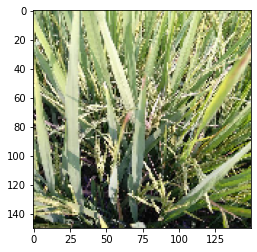

In [ ]:
# Test image preprocess
random_class = os.path.join(test_split_dir, random.choice(paddyleaf_classname))
random_image = random.choice(os.listdir(random_class))
selected_image = load_img(os.path.join(random_class, random_image), target_size=target_size)
x = img_to_array(selected_image)
x = np.expand_dims(x, axis=0)
x = np.vstack([x])
x /= 255.

# Predict the image
classes = modelv1d3.predict(x)
predicted_class = np.argmax(classes[0])

# Display the image and its predicted class
imageplot = plt.imshow(selected_image)
print("Actual class: {}".format(random_class.split('/')[-1]))
print("Predicted class: {}\n with the probabilities for each class as follow \n{}".format(paddyleaf_classname[predicted_class], classes[0]))

## **Save & Export Model**

In [ ]:
# Save the model
## Define temporary directory for save the model
MODEL_DIR = tempfile.gettempdir()
version = 1
diff = 1
version_path = os.path.join(MODEL_DIR, str(version))
export_path = os.path.join(version_path, str(diff))

## Ensure the temporary file
if os.path.isdir(export_path):
    print('\nPrepare the path, cleaning up!\n')
    !rm -r {export_path}

## Save the model
### tf format
modelv1d3.save(export_path, save_format="tf")
print('\nexport_path = {}'.format(export_path))
!ls -l {export_path}

### h5 keras format
saved_h5_format = './paddymodelv1d3.h5' 
modelv1d3.save(saved_h5_format)


Prepare the path, cleaning up!

INFO:tensorflow:Assets written to: /tmp/1/1/assets

export_path = /tmp/1/1
total 4072
drwxr-xr-x 2 root root    4096 Jun  1 15:10 assets
-rw-r--r-- 1 root root  482411 Jun  1 15:10 keras_metadata.pb
-rw-r--r-- 1 root root 3676649 Jun  1 15:10 saved_model.pb
drwxr-xr-x 2 root root    4096 Jun  1 15:10 variables


In [ ]:
# Convert to .json format
## Install required library
!pip install tensorflowjs

## Path to .json directory
export_json_path = os.path.join(export_path, 'json_format')

## Ensure the temporary file
if os.path.isdir(export_json_path):
    print('\nPrepare the path, cleaning up!\n')
    !rm -r {export_json_path}

## Convert command
!tensorflowjs_converter --input_format=keras {saved_h5_format} {export_json_path}

##
!zip -r './jsonmodelv1d3.zip' {export_json_path}

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/

Prepare the path, cleaning up!

  adding: tmp/1/1/json_format/ (stored 0%)
  adding: tmp/1/1/json_format/group1-shard7of85.bin (deflated 7%)
  adding: tmp/1/1/json_format/group1-shard56of85.bin (deflated 8%)
  adding: tmp/1/1/json_format/group1-shard44of85.bin (deflated 8%)
  adding: tmp/1/1/json_format/group1-shard39of85.bin (deflated 8%)
  adding: tmp/1/1/json_format/group1-shard19of85.bin (deflated 8%)
  adding: tmp/1/1/json_format/group1-shard82of85.bin (deflated 8%)
  adding: tmp/1/1/json_format/group1-shard12of85.bin (deflated 8%)
  adding: tmp/1/1/json_format/group1-shard70of85.bin (deflated 8%)
  adding: tmp/1/1/json_format/group1-shard54of85.bin (deflated 8%)
  adding: tmp/1/1/json_format/group1-shard69of85.bin (deflated 8%)
  adding: tmp/1/1/json_format/group1-shard6of85.bin (deflated 7%)
  adding: tmp/1/1/json_format/group1-shard73of85.bin (deflated 8%)
  adding: tmp/1/1/json_

In [ ]:
# Convert to .tflite format
## Intialize the TFLite converter to load the SavedModel
converter = tf.lite.TFLiteConverter.from_saved_model(export_path)

## Set the optimization strategy for 'size' in the converter 
converter.optimizations = [tf.lite.Optimize.OPTIMIZE_FOR_SIZE]

## Use the tool to finally convert the model
tflite_model = converter.convert()

## Write TFLite model and its classes
tflite_model_file = 'paddymodel_v1_d3.tflite'

with open(tflite_model_file, "wb") as tf:
    tf.write(tflite_model)

with open('paddyclasses_v1_d3.txt', 'w') as classes:
    classes.write('\n'.join(paddyleaf_classname))

In [ ]:
try:
    files.download('paddymodel_v1_d3.tflite')
    files.download('paddyclasses_v1_d3.txt')
    files.download('jsonmodelv1d3.zip')
    
except:
    pass

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>